# __프로젝트 1: Image Classification__  
- VGG16 모델을 구현하여 Image classification task를 진행하고 다양한 방법을 사용하여 모델의 성능을 올려봅시다.
## __1. VGG16 모델__  
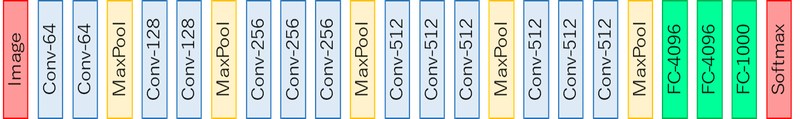
- VGG16 모델의 Image Classification task에서 자주 사용하는 대표적인 모델  
## __2. 코드 살펴보기__
- __문제 1-1. VGG 모델 구현하기__  
    영상의 내용을 참고하여 직접 코드로 모델을 구현해 보게요. BatchNormalization, parameter initialization 등을 사용할 수도 있습니다.  
- __문제 1-2. 다양한 방법을 사용하여 모델의 성능 올리기__  
    skip connection, pre-trained model 등 다양한 방법을 사용하여 기본적인 VGG16 모델의 성능보다 높은 정확도를 구해보세요.


먼저 필요한 라이브러리를 불러옵니다.

In [5]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import os
import numpy as np
import matplotlib.pyplot as plt

데이터를 준비합니다. 불러온 데이터는 캐글에서 제공되는 개와 고양이의 데이터로, 이번 프로젝트에서 우리는 개와 고양이를 분류할 예정입니다.  
test 데이터에서 __1은 개__, __0은 고양이__ 를 의미합니다.

In [6]:
_URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'

path_to_zip = tf.keras.utils.get_file('cats_and_dogs.zip', origin=_URL, extract=True)

path = os.path.join(os.path.dirname(path_to_zip), 'cats_and_dogs_filtered')

train 데이터와 validation 데이터에서 개와 고양이 이미지가 저장된 경로를 각각 변수에 저장해 둡니다.

In [7]:
train_dir = os.path.join(path, 'train')
validation_dir = os.path.join(path, 'validation')
print(train_dir)
print(validation_dir)

C:\Users\pc\.keras\datasets\cats_and_dogs_filtered\train
C:\Users\pc\.keras\datasets\cats_and_dogs_filtered\validation


In [8]:
# directory with our training cat pictures
train_cats_dir = os.path.join(train_dir, 'cats') 
print(train_cats_dir)

# directory with our training dog pictures 
train_dogs_dir = os.path.join(train_dir, 'dogs')  
print(train_dogs_dir)

# directory with our validation cat pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')  
print(validation_cats_dir)

# directory with our validation dog pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')  
print(validation_dogs_dir)

C:\Users\pc\.keras\datasets\cats_and_dogs_filtered\train\cats
C:\Users\pc\.keras\datasets\cats_and_dogs_filtered\train\dogs
C:\Users\pc\.keras\datasets\cats_and_dogs_filtered\validation\cats
C:\Users\pc\.keras\datasets\cats_and_dogs_filtered\validation\dogs


train 데이터와 validation 데이터의 개수를 알아봅시다.

In [5]:
num_cats_tr = len(os.listdir(train_cats_dir))
print('total training cat images:', num_cats_tr)
num_dogs_tr = len(os.listdir(train_dogs_dir))
print('total training dog images:', num_dogs_tr)

print("--")

num_cats_val = len(os.listdir(validation_cats_dir))
print('total validation cat images:', num_cats_val)
num_dogs_val = len(os.listdir(validation_dogs_dir))
print('total validation dog images:', num_dogs_val)

print("--")

total_train = num_cats_tr + num_dogs_tr
print("Total training images:", total_train)
total_val = num_cats_val + num_dogs_val
print("Total validation images:", total_val)

total training cat images: 1000
total training dog images: 1000
--
total validation cat images: 500
total validation dog images: 500
--
Total training images: 2000
Total validation images: 1000


필요한 파라미터를 설정해 줍시다. 파라미터를 수정하면 성능을 높일 수 있으니 다양한 실험을 해보세요.

In [6]:
# parameter Initialization
batch_size = 16
epochs = 5
IMG_HEIGHT = 256
IMG_WIDTH = 256

이미지를 확인하기 위해 데이터를 시각화하는 함수를 만들어 봅시다. 간단한 함수이기 때문에 자세한 코드 설명은 생략하겠습니다. 궁금하다면 구글링을 통해 각 코드가 어떤 역할을 하는지 찾아보세요.

In [8]:
# 데이터를 시각화하기 위한 함수
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(10,10))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

train 데이터가 2천장 밖에 되지 않기 때문에 Data Augmentation(데이터 증강)을 통해 데이터의 수를 늘립니다.

Data Augmentation은 Rescale, Rotation, Random Crop, Zoom, Flip 등 다양한 기법을 사용하여 데이터의 양을 증가시키는 것입니다.  
range의 숫자를 변화시키거나 Flip에서 True/False를 적절하게 사용하여 다양한 실험을 해보세요.

In [9]:
# Training data generator
image_gen_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=0.3,
                                     width_shift_range=0.1,
                                     height_shift_range=0.1,
                                     zoom_range=0.2,
                                     horizontal_flip=True, 
                                     vertical_flip=False)

```.flow_from_directory```를 사용하여 파이프라인을 만들어 directory와 작업 환경을 연결시켜 줍니다.  
우리는 개와 고양이를 분류하는 task를 수행하기 때문에 ```class_mode```는 'binary'입니다. Classification task에 따라 ```class_mode```를 변경하시면 됩니다.

In [10]:
train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')

Found 2000 images belonging to 2 classes.


Data Augmentation이 제대로 되었는지 확인해 봅시다.

In [11]:
train_data_gen[0][0].shape

(16, 256, 256, 3)

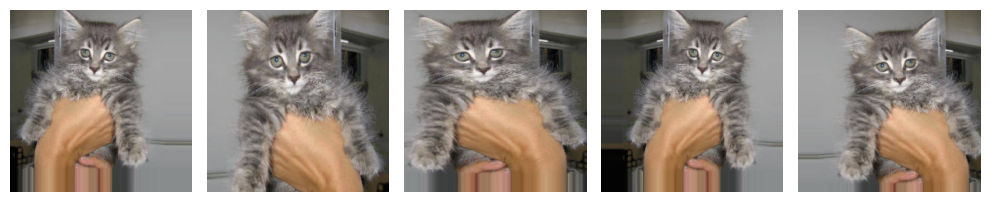

In [12]:
augmented_images = [train_data_gen[0][0][0] for i in range(5)]
plotImages(augmented_images)

Validation 데이터에도 train 데이터와 같은 동일한 작업을 해 줍니다. 그러나 Validation 데이터는 classification이 잘 되는지 평가하는 용도로 사용되기 때문에 데이터의 스케일만 변경해 줍니다.

In [13]:
# Validation data generator
image_gen_val = ImageDataGenerator(rescale=1./255)

In [14]:
val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

Found 1000 images belonging to 2 classes.


Validation 데이터를 확인해 봅시다. 크게 이미지와 정답 데이터로 구성이 되어 있습니다.

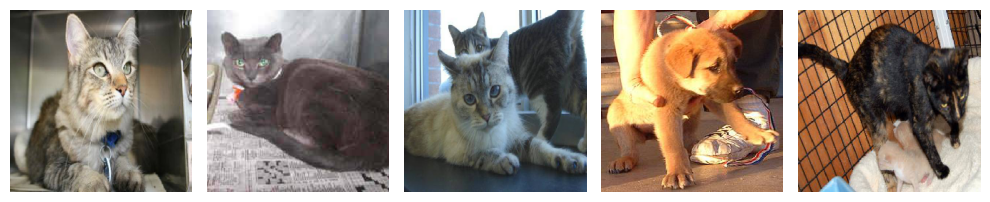

In [15]:
sample_training_images, _ = next(val_data_gen)
plotImages(sample_training_images[:5])

In [16]:
_[:5] # 정답 데이터

array([0., 0., 0., 1., 0.], dtype=float32)

### __문제 1-1. VGG16 모델 구현하기__  
이제 VGG16 모델을 구현해 볼 시간입니다. 바로 혼자서 모델을 구현하라고 하면 어렵겠죠? 그래서 참고할만한 모델 구현 코드를 아래에 적어 보았습니다.  
실제 VGG16 모델과는 살짝 구조가 다르기 때문에 이미지를 보면서 어느 부분이 다른지 찾아 보는 것도 좋을 것 같습니다.
```
# 참고 코드

input_layer=tf.keras.layers.Input(shape=(256, 256, 3))
x=tf.keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(input_layer)
x=tf.keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Flatten()(x)
x=tf.keras.layers.Dense(1024, activation='relu')(x)
x=tf.keras.layers.Dense(512, activation='relu')(x)
out_layer=tf.keras.layers.Dense(1, activation='sigmoid')(x)

model = tf.keras.Model(inputs=[input_layer], outputs=[out_layer])
model.summary()
```
VGG16 모델의 구조를 다시 상기해 보고, 위의 코드를 참고하여 VGG16 모델을 직접 구현해 보세요.

| 아래 이미지와 동일하게 VGG16 모델을 구현하려면 GPU 크키가 더 커야할 수도 있습니다. 구현한 모델을 학습시키다가 커널이 죽을 경우에는 모델 사이즈를 작게 수정해 보세요.
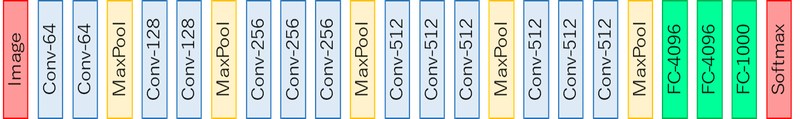

In [22]:
input_layer = tf.keras.layers.Input(shape=(IMG_HEIGHT, IMG_WIDTH, 3))

# Block 1
x = tf.keras.layers.Conv2D(64, (3, 3), strides = 1, activation = 'relu', padding = 'same')(input_layer)
x = tf.keras.layers.Conv2D(64, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)

# Block 2
x = tf.keras.layers.Conv2D(128, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(128, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)

# Block 3
x = tf.keras.layers.Conv2D(256, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(256, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(256, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)

# Block 4
x = tf.keras.layers.Conv2D(512, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(512, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(512, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)

# Block 5
x = tf.keras.layers.Conv2D(512, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(512, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(512, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)

# Fully connected layers
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(4096, activation = 'relu')(x)
x = tf.keras.layers.Dense(4096, activation = 'relu')(x)
out_layer = tf.keras.layers.Dense(1000, activation = 'relu')(x)

model = tf.keras.Model(inputs = [input_layer], outputs = [out_layer])
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_13 (Conv2D)          (None, 256, 256, 64)      1792      
                                                                 
 conv2d_14 (Conv2D)          (None, 256, 256, 64)      36928     
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 128, 128, 64)      0         
 g2D)                                                            
                                                                 
 conv2d_15 (Conv2D)          (None, 128, 128, 128)     73856     
                                                                 
 conv2d_16 (Conv2D)          (None, 128, 128, 128)     147584    
                                                           

손실함수, optimizer, metric을 설정해 줍니다.

손실함수와 metric은 분류 task에 따라 다양하게 바꿀 수 있습니다. optimizer도 Adam 외에 다양한 것을 사용할 수 있습니다. 자유롭게 바꿔보세요.

In [24]:
loss_function=tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.Adam(learning_rate=0.01)
metric=tf.keras.metrics.binary_accuracy
model.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

# callbacks_list= [tf.keras.callbacks.TensorBoard(log_dir='log_dir', histogram_freq=1)]
# callback 함수를 활용하고 싶다면 추가해서 학습하는 데에 활용해 보세요.

모델 학습을 시켜봅시다.  
data generator는 입력 데이터와 타겟(라벨)의 batch를 끝없이 반환합니다.  
batch가 끝없이 생성되기 때문에, 한 번의 epoch에 generator로부터 얼마나 많은 샘플을 뽑을지 모델에 전달해야 합니다.  
만약 batch_size=20이고 steps_per_epoch=100일 경우 (데이터, 라벨)의 쌍 20개가 생성되고, 크기가 20인 batch 데이터를 100번 학습하면 1 epoch이 완료됩니다. 단, 크기 20의 batch 데이터는 매번 랜덤으로 생성됩니다.  

일반적으로 (전체 데이터 길이/batch_size)를 steps_per_epoch으로 설정합니다.

In [ ]:
# 여기서부터는 lms에서 돌린 결과를 붙여넣겠습니다.

history = model.fit(
      train_data_gen,
      steps_per_epoch=(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size,
      epochs=epochs,
      validation_data=val_data_gen,
      # callbacks=callbacks_list,
      validation_freq=1)

```
Epoch 1/5
125/125 [==============================] - 42s 326ms/step - loss: 4094598.2500 - binary_accuracy: 0.5060 - val_loss: 0.6933 - val_binary_accuracy: 0.5000
Epoch 2/5
125/125 [==============================] - 40s 317ms/step - loss: 0.6983 - binary_accuracy: 0.4970 - val_loss: 0.6932 - val_binary_accuracy: 0.5000
Epoch 3/5
125/125 [==============================] - 40s 320ms/step - loss: 0.6971 - binary_accuracy: 0.4870 - val_loss: 0.6933 - val_binary_accuracy: 0.5000
Epoch 4/5
125/125 [==============================] - 40s 319ms/step - loss: 0.6972 - binary_accuracy: 0.5160 - val_loss: 0.7049 - val_binary_accuracy: 0.5000
Epoch 5/5
125/125 [==============================] - 40s 319ms/step - loss: 0.6939 - binary_accuracy: 0.5160 - val_loss: 0.6934 - val_binary_accuracy: 0.5000
```

In [ ]:
# 시각화
acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo', label='Training acc')
plt.plot(epochs_range, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo', label='Training loss')
plt.plot(epochs_range, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

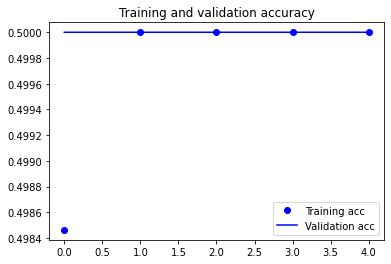
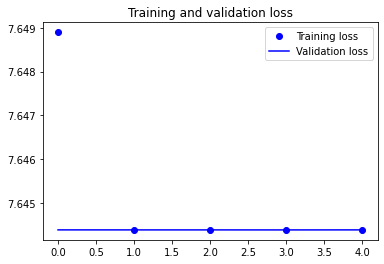

- epoch 1에서 train loss 값이 매우 컸음 (4094598.25)
- 이후 train loss 값은 0.69 정도의 값으로 수렴.
- validation acc은 처음부터 끝까지 0.5를 유지, val loss는 train loss와 마찬가지로 0.69 정도의 값으로 수렴.

### __문제 1-2. 다양한 방법을 사용하여 모델의 성능 올리기__  
hyperparameter 변경, 모델 수정, optimizer 변경, skip connection, pre-trained model 등 다양한 방법을 사용하면 모델의 성능을 높일 수 있습니다. 다양한 실험을 통해 성능을 올려 보세요.

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import os
import numpy as np
import matplotlib.pyplot as plt

_URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'

path_to_zip = tf.keras.utils.get_file('cats_and_dogs.zip', origin=_URL, extract=True)

path = os.path.join(os.path.dirname(path_to_zip), 'cats_and_dogs_filtered')

train_dir = os.path.join(path, 'train')
validation_dir = os.path.join(path, 'validation')

# parameter Initialization
batch_size = 32
epochs = 5
IMG_HEIGHT = 256
IMG_WIDTH = 256

# 데이터를 시각화하기 위한 함수
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(10,10))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Training data generator
image_gen_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=0.3,
                                     width_shift_range=0.1,
                                     height_shift_range=0.1,
                                     zoom_range=0.2,
                                     horizontal_flip=True, 
                                     vertical_flip=False)

train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')

# Validation data generator
image_gen_val = ImageDataGenerator(rescale=1./255)

val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

# 문제1-1. 이미지에 나온 VGG16 모델을 구현하세요.  
input_layer = tf.keras.layers.Input(shape=(IMG_HEIGHT, IMG_WIDTH, 3))

# Block 1
x = tf.keras.layers.Conv2D(64, (3, 3), strides = 1, activation = 'relu', padding = 'same')(input_layer)
x = tf.keras.layers.Conv2D(64, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)

# Block 2
x = tf.keras.layers.Conv2D(128, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(128, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)

# Block 3
x = tf.keras.layers.Conv2D(256, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(256, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(256, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)

# Block 4
x = tf.keras.layers.Conv2D(512, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(512, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(512, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)

# Block 5
x = tf.keras.layers.Conv2D(512, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(512, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(512, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)

# Fully connected layers
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(4096, activation = 'relu')(x)
x = tf.keras.layers.Dense(4096, activation = 'relu')(x)
out_layer = tf.keras.layers.Dense(1, activation='sigmoid')(x)

model = tf.keras.Model(inputs = [input_layer], outputs = [out_layer])
model.summary()

loss_function=tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.Adam(learning_rate=0.001)   # learning_rate 조정
metric=tf.keras.metrics.binary_accuracy
model.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

history = model.fit(
      train_data_gen,
      steps_per_epoch=(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size,
      epochs=epochs,
      validation_data=val_data_gen,
      validation_freq=1)

acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo', label='Training acc')
plt.plot(epochs_range, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo', label='Training loss')
plt.plot(epochs_range, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

```
Epoch 1/5
62/62 [==============================] - 41s 643ms/step - loss: 0.7018 - binary_accuracy: 0.4980 - val_loss: 0.6932 - val_binary_accuracy: 0.5000
Epoch 2/5
62/62 [==============================] - 40s 629ms/step - loss: 0.6936 - binary_accuracy: 0.4910 - val_loss: 0.6932 - val_binary_accuracy: 0.5000
Epoch 3/5
62/62 [==============================] - 40s 627ms/step - loss: 0.6932 - binary_accuracy: 0.4940 - val_loss: 0.6931 - val_binary_accuracy: 0.5000
Epoch 4/5
62/62 [==============================] - 40s 629ms/step - loss: 0.6932 - binary_accuracy: 0.5000 - val_loss: 0.6931 - val_binary_accuracy: 0.5000
Epoch 5/5
62/62 [==============================] - 40s 628ms/step - loss: 0.6932 - binary_accuracy: 0.4780 - val_loss: 0.6931 - val_binary_accuracy: 0.5000
```

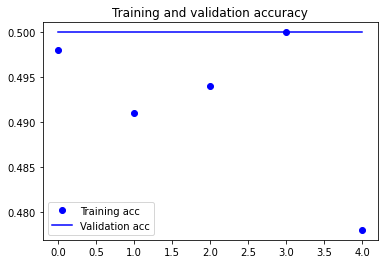
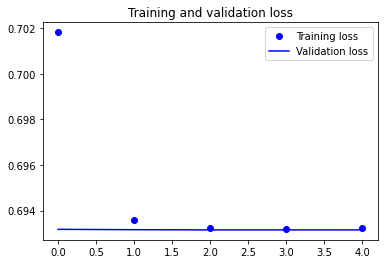

- epoch 1에서 train loss 값이 튀는 현상이 사라짐.
- train loss 값이 0.69 정도의 값으로 수렴.
- validation acc은 처음부터 끝까지 0.5를 유지, val loss는 train loss와 마찬가지로 0.69 정도의 값으로 수렴.

In [ ]:
# ImageData Generator 값 수정, BatchNormalization, Dropout 추가

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import os
import numpy as np
import matplotlib.pyplot as plt

_URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'

path_to_zip = tf.keras.utils.get_file('cats_and_dogs.zip', origin=_URL, extract=True)

path = os.path.join(os.path.dirname(path_to_zip), 'cats_and_dogs_filtered')

train_dir = os.path.join(path, 'train')
validation_dir = os.path.join(path, 'validation')


# directory with our training cat pictures
train_cats_dir = os.path.join(train_dir, 'cats') 

# directory with our training dog pictures 
train_dogs_dir = os.path.join(train_dir, 'dogs')  

# directory with our validation cat pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')  

# directory with our validation dog pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')  

# parameter Initialization
batch_size = 8
epochs = 5
IMG_HEIGHT = 224   # VGG16 모델이 224x224 크기에 맞게 설계되었고, 표준적인 방법을 따르는 것이 일반적으로 더 나은 성능을 내기 때문에 사이즈 변경
IMG_WIDTH = 224

# 데이터를 시각화하기 위한 함수
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(10,10))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Training data generator
image_gen_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=15,  # 0.3 -> 15
                                     width_shift_range=0.1,
                                     height_shift_range=0.1,
                                     shear_range = 0.1,   # 추가
                                     zoom_range=0.2,     # 추가
                                     horizontal_flip=True, 
                                     vertical_flip=False)
                                    

train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')

# Validation data generator
image_gen_val = ImageDataGenerator(rescale=1./255)

val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

# 문제1-1. 이미지에 나온 VGG16 모델을 구현하세요.  
input_layer = tf.keras.layers.Input(shape=(IMG_HEIGHT, IMG_WIDTH, 3))

# Block 1
x = tf.keras.layers.Conv2D(64, (3, 3), strides = 1, activation = 'relu', padding = 'same')(input_layer)
x = tf.keras.layers.Conv2D(64, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)
x = tf.keras.layers.Dropout(0.25)(x)

# Block 2
x = tf.keras.layers.Conv2D(128, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(128, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)
x = tf.keras.layers.Dropout(0.25)(x)

# Block 3
x = tf.keras.layers.Conv2D(256, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(256, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(256, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)
x = tf.keras.layers.Dropout(0.25)(x)

# Block 4
x = tf.keras.layers.Conv2D(512, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(512, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(512, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)
x = tf.keras.layers.Dropout(0.25)(x)

# Block 5
x = tf.keras.layers.Conv2D(512, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(512, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(512, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)
x = tf.keras.layers.Dropout(0.25)(x)

# Fully connected layers
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(4096, activation = 'relu')(x)
x = tf.keras.layers.Dense(4096, activation = 'relu')(x)
out_layer = tf.keras.layers.Dense(1, activation='sigmoid')(x)

model = tf.keras.Model(inputs = [input_layer], outputs = [out_layer])
model.summary()

loss_function=tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.Adam(learning_rate=0.001)   # learning_rate 조정
metric=tf.keras.metrics.binary_accuracy
model.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

history = model.fit(
      train_data_gen,
      steps_per_epoch=(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size,
      epochs=epochs,
      validation_data=val_data_gen,
      validation_freq=1)

acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo', label='Training acc')
plt.plot(epochs_range, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo', label='Training loss')
plt.plot(epochs_range, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

```
Epoch 1/5
250/250 [==============================] - 52s 205ms/step - loss: 2.7204 - binary_accuracy: 0.5075 - val_loss: 0.7618 - val_binary_accuracy: 0.4950
Epoch 2/5
250/250 [==============================] - 50s 200ms/step - loss: 0.7559 - binary_accuracy: 0.5205 - val_loss: 0.7007 - val_binary_accuracy: 0.5420
Epoch 3/5
250/250 [==============================] - 50s 201ms/step - loss: 0.7104 - binary_accuracy: 0.5160 - val_loss: 0.7240 - val_binary_accuracy: 0.4910
Epoch 4/5
250/250 [==============================] - 50s 201ms/step - loss: 0.7122 - binary_accuracy: 0.5015 - val_loss: 0.6798 - val_binary_accuracy: 0.5700
Epoch 5/5
250/250 [==============================] - 50s 200ms/step - loss: 0.7080 - binary_accuracy: 0.5375 - val_loss: 0.6953 - val_binary_accuracy: 0.5510
```

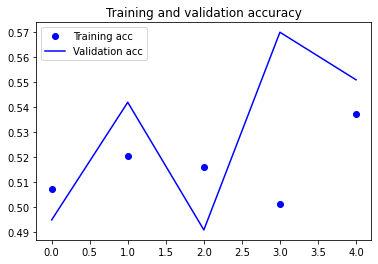
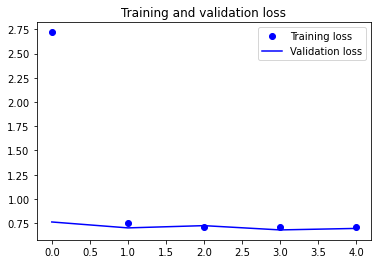

- val acc에 드디어 변화가...!

In [ ]:
# VGG16 모델은 유지할 수 없지만, layer 수를 줄여 테스트

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping   # EarlyStopping 추가

import os
import numpy as np
import matplotlib.pyplot as plt

_URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'

path_to_zip = tf.keras.utils.get_file('cats_and_dogs.zip', origin=_URL, extract=True)

path = os.path.join(os.path.dirname(path_to_zip), 'cats_and_dogs_filtered')

train_dir = os.path.join(path, 'train')
validation_dir = os.path.join(path, 'validation')


# directory with our training cat pictures
train_cats_dir = os.path.join(train_dir, 'cats') 

# directory with our training dog pictures 
train_dogs_dir = os.path.join(train_dir, 'dogs')  

# directory with our validation cat pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')  

# directory with our validation dog pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')  

# parameter Initialization
batch_size = 8
epochs = 20
IMG_HEIGHT = 128   # 메모리 문제로 사이즈 감소
IMG_WIDTH = 128

# 데이터를 시각화하기 위한 함수
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(10,10))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Training data generator
image_gen_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=15,  # 0.3 -> 15
                                     width_shift_range=0.1,
                                     height_shift_range=0.1,
                                     shear_range = 0.1,   # 추가
                                     zoom_range=0.2,     # 추가
                                     horizontal_flip=True, 
                                     vertical_flip=False)
                                    

train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')

# Validation data generator
image_gen_val = ImageDataGenerator(rescale=1./255)

val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

# 문제1-1. 이미지에 나온 VGG16 모델을 구현하세요.  
input_layer = tf.keras.layers.Input(shape=(IMG_HEIGHT, IMG_WIDTH, 3))

# Block 1
x = tf.keras.layers.Conv2D(64, (3, 3), strides = 1, activation = 'relu', padding = 'same')(input_layer)
x = tf.keras.layers.Conv2D(64, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)
x = tf.keras.layers.Dropout(0.25)(x)

# Block 2
x = tf.keras.layers.Conv2D(128, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(128, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)
x = tf.keras.layers.Dropout(0.25)(x)

# Block 3
x = tf.keras.layers.Conv2D(256, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(256, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(256, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)
x = tf.keras.layers.Dropout(0.25)(x)

# Block 4
x = tf.keras.layers.Conv2D(512, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(512, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(512, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)
x = tf.keras.layers.Dropout(0.25)(x)

# Block 5 삭제

# Fully connected layers
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(1024, activation = 'relu')(x)   # 메모리 오류로 유닛 수 줄이기
x = tf.keras.layers.Dense(1024, activation = 'relu')(x)
out_layer = tf.keras.layers.Dense(1, activation='sigmoid')(x)

model = tf.keras.Model(inputs = [input_layer], outputs = [out_layer])
model.summary()

early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

loss_function=tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.Adam(learning_rate=0.001)   # learning_rate 조정
metric=tf.keras.metrics.binary_accuracy
model.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

history = model.fit(
      train_data_gen,
      steps_per_epoch=(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size,
      epochs=epochs,
      validation_data=val_data_gen,
      validation_freq=1,
      callbacks=[early_stopping])

acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo', label='Training acc')
plt.plot(epochs_range, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo', label='Training loss')
plt.plot(epochs_range, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

```
Epoch 1/20
250/250 [==============================] - 19s 68ms/step - loss: 2.3371 - binary_accuracy: 0.5370 - val_loss: 0.8443 - val_binary_accuracy: 0.5270
Epoch 2/20
250/250 [==============================] - 17s 67ms/step - loss: 0.7651 - binary_accuracy: 0.5405 - val_loss: 0.6829 - val_binary_accuracy: 0.6100
Epoch 3/20
250/250 [==============================] - 16s 65ms/step - loss: 0.7046 - binary_accuracy: 0.5610 - val_loss: 1.0014 - val_binary_accuracy: 0.5690
Epoch 4/20
250/250 [==============================] - 16s 65ms/step - loss: 0.6952 - binary_accuracy: 0.5710 - val_loss: 0.6926 - val_binary_accuracy: 0.5380
Epoch 5/20
250/250 [==============================] - 17s 66ms/step - loss: 0.6685 - binary_accuracy: 0.5895 - val_loss: 0.6624 - val_binary_accuracy: 0.6190
Epoch 6/20
250/250 [==============================] - 17s 67ms/step - loss: 0.6607 - binary_accuracy: 0.6150 - val_loss: 0.6488 - val_binary_accuracy: 0.6180
Epoch 7/20
250/250 [==============================] - 17s 66ms/step - loss: 0.6553 - binary_accuracy: 0.6250 - val_loss: 0.6437 - val_binary_accuracy: 0.6250
Epoch 8/20
250/250 [==============================] - 17s 67ms/step - loss: 0.6372 - binary_accuracy: 0.6365 - val_loss: 0.6343 - val_binary_accuracy: 0.6560
Epoch 9/20
250/250 [==============================] - 16s 66ms/step - loss: 0.6473 - binary_accuracy: 0.6350 - val_loss: 0.6642 - val_binary_accuracy: 0.5980
Epoch 10/20
250/250 [==============================] - 16s 66ms/step - loss: 0.6515 - binary_accuracy: 0.6300 - val_loss: 0.6705 - val_binary_accuracy: 0.5750
Epoch 11/20
250/250 [==============================] - 17s 66ms/step - loss: 0.6480 - binary_accuracy: 0.6335 - val_loss: 0.6334 - val_binary_accuracy: 0.6500
Epoch 12/20
250/250 [==============================] - 17s 66ms/step - loss: 0.6444 - binary_accuracy: 0.6445 - val_loss: 0.7905 - val_binary_accuracy: 0.6160
Epoch 13/20
250/250 [==============================] - 17s 67ms/step - loss: 0.6332 - binary_accuracy: 0.6530 - val_loss: 0.6216 - val_binary_accuracy: 0.6760
Epoch 14/20
250/250 [==============================] - 17s 66ms/step - loss: 0.6275 - binary_accuracy: 0.6580 - val_loss: 0.6544 - val_binary_accuracy: 0.5910
Epoch 15/20
250/250 [==============================] - 17s 66ms/step - loss: 0.6306 - binary_accuracy: 0.6460 - val_loss: 0.6351 - val_binary_accuracy: 0.6450
Epoch 16/20
250/250 [==============================] - 17s 66ms/step - loss: 0.6300 - binary_accuracy: 0.6610 - val_loss: 0.7827 - val_binary_accuracy: 0.5220
```
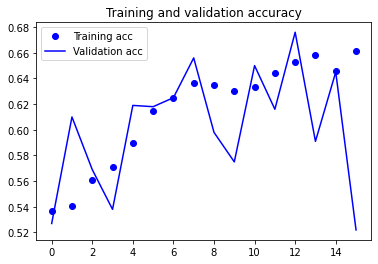
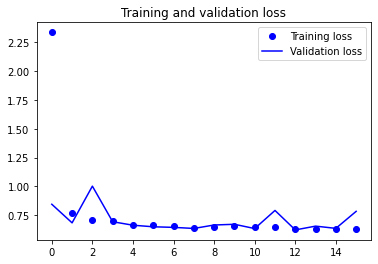

- 레이어 수를 줄이니 오히려 학습이 잘 된다?
- 그래도 val acc는 오락가락하고 있으므로 (과적합), 레이어 수를 더 줄여보자.

In [ ]:
# 한 층 더 삭제, block마다 conv2D, dense 레이어 하나씩 삭제
# 아직 과적합의 문제가 남았다. dropout 조절
# 우선 Dense layer에만 L2 규제 추가
# (위 과정은 모두 따로 수행되었으나 GitHub 업로드를 위해 통합되었습니다.)

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping   # EarlyStopping 추가
from tensorflow.keras.regularizers import l2

import os
import numpy as np
import matplotlib.pyplot as plt

_URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'

path_to_zip = tf.keras.utils.get_file('cats_and_dogs.zip', origin=_URL, extract=True)

path = os.path.join(os.path.dirname(path_to_zip), 'cats_and_dogs_filtered')

train_dir = os.path.join(path, 'train')
validation_dir = os.path.join(path, 'validation')


# directory with our training cat pictures
train_cats_dir = os.path.join(train_dir, 'cats') 

# directory with our training dog pictures 
train_dogs_dir = os.path.join(train_dir, 'dogs')  

# directory with our validation cat pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')  

# directory with our validation dog pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')  

# parameter Initialization
batch_size = 8
epochs = 50  # epoch 수 증가
IMG_HEIGHT = 128   # 메모리 문제로 사이즈 감소
IMG_WIDTH = 128

# 데이터를 시각화하기 위한 함수
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(10,10))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Training data generator
image_gen_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=15,  # 0.3 -> 15
                                     width_shift_range=0.1,
                                     height_shift_range=0.1,
                                     shear_range = 0.1,   # 추가
                                     zoom_range=0.2,     # 추가
                                     horizontal_flip=True, 
                                     vertical_flip=False)
                                    

train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')

# Validation data generator
image_gen_val = ImageDataGenerator(rescale=1./255)

val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

# 문제1-1. 이미지에 나온 VGG16 모델을 구현하세요.  
input_layer = tf.keras.layers.Input(shape=(IMG_HEIGHT, IMG_WIDTH, 3))

# Block 1
x = tf.keras.layers.Conv2D(64, (3, 3), strides = 1, activation = 'relu', padding = 'same')(input_layer)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)
x = tf.keras.layers.Dropout(0.4)(x)

# Block 2
x = tf.keras.layers.Conv2D(128, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)
x = tf.keras.layers.Dropout(0.4)(x)

# Block 3
x = tf.keras.layers.Conv2D(256, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.Conv2D(256, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)
x = tf.keras.layers.Dropout(0.6)(x)   # 마지막 block의 dropout값만 조절해보자.

# Block 4 삭제

# Block 5 삭제

# Fully connected layers
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(1024, activation='relu', kernel_regularizer=l2(0.001))(x)  # L2 규제 추가
out_layer = tf.keras.layers.Dense(1, activation='sigmoid')(x)


model = tf.keras.Model(inputs = [input_layer], outputs = [out_layer])
model.summary()

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

loss_function=tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.Adam(learning_rate=0.001)   # learning_rate 조정
metric=tf.keras.metrics.binary_accuracy
model.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

history = model.fit(
      train_data_gen,
      steps_per_epoch=(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size,
      epochs=epochs,
      validation_data=val_data_gen,
      validation_freq=1,
      callbacks=[early_stopping])

acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo', label='Training acc')
plt.plot(epochs_range, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo', label='Training loss')
plt.plot(epochs_range, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

```
Epoch 1/50
250/250 [==============================] - 16s 61ms/step - loss: 9.2982 - binary_accuracy: 0.5580 - val_loss: 4.5655 - val_binary_accuracy: 0.5160
Epoch 2/50
250/250 [==============================] - 15s 61ms/step - loss: 3.7127 - binary_accuracy: 0.6000 - val_loss: 3.4265 - val_binary_accuracy: 0.5640
Epoch 3/50
250/250 [==============================] - 16s 63ms/step - loss: 2.8076 - binary_accuracy: 0.5970 - val_loss: 2.5512 - val_binary_accuracy: 0.5850
Epoch 4/50
250/250 [==============================] - 15s 62ms/step - loss: 2.0726 - binary_accuracy: 0.6385 - val_loss: 1.9971 - val_binary_accuracy: 0.6120
Epoch 5/50
250/250 [==============================] - 15s 61ms/step - loss: 1.6800 - binary_accuracy: 0.6380 - val_loss: 1.9752 - val_binary_accuracy: 0.5610
Epoch 6/50
250/250 [==============================] - 15s 59ms/step - loss: 1.4748 - binary_accuracy: 0.6390 - val_loss: 1.4548 - val_binary_accuracy: 0.6850
Epoch 7/50
250/250 [==============================] - 15s 60ms/step - loss: 2.0811 - binary_accuracy: 0.5840 - val_loss: 2.2140 - val_binary_accuracy: 0.6050
Epoch 8/50
250/250 [==============================] - 15s 60ms/step - loss: 1.7799 - binary_accuracy: 0.6220 - val_loss: 1.5052 - val_binary_accuracy: 0.6330
Epoch 9/50
250/250 [==============================] - 15s 60ms/step - loss: 1.3082 - binary_accuracy: 0.6400 - val_loss: 1.2989 - val_binary_accuracy: 0.6550
Epoch 10/50
250/250 [==============================] - 15s 60ms/step - loss: 1.1869 - binary_accuracy: 0.6485 - val_loss: 1.1851 - val_binary_accuracy: 0.5880
Epoch 11/50
250/250 [==============================] - 16s 62ms/step - loss: 1.0994 - binary_accuracy: 0.6670 - val_loss: 1.2921 - val_binary_accuracy: 0.5330
Epoch 12/50
250/250 [==============================] - 16s 63ms/step - loss: 1.1305 - binary_accuracy: 0.6590 - val_loss: 1.1578 - val_binary_accuracy: 0.6370
Epoch 13/50
250/250 [==============================] - 16s 63ms/step - loss: 1.1022 - binary_accuracy: 0.6660 - val_loss: 1.0958 - val_binary_accuracy: 0.5980
Epoch 14/50
250/250 [==============================] - 15s 61ms/step - loss: 1.0161 - binary_accuracy: 0.6705 - val_loss: 0.9710 - val_binary_accuracy: 0.6860
Epoch 15/50
250/250 [==============================] - 15s 60ms/step - loss: 0.9066 - binary_accuracy: 0.6830 - val_loss: 0.9511 - val_binary_accuracy: 0.6740
Epoch 16/50
250/250 [==============================] - 15s 60ms/step - loss: 1.0174 - binary_accuracy: 0.6815 - val_loss: 0.9210 - val_binary_accuracy: 0.7190
Epoch 17/50
250/250 [==============================] - 15s 60ms/step - loss: 0.8779 - binary_accuracy: 0.6940 - val_loss: 0.9426 - val_binary_accuracy: 0.6410
Epoch 18/50
250/250 [==============================] - 15s 61ms/step - loss: 0.8636 - binary_accuracy: 0.6900 - val_loss: 0.8968 - val_binary_accuracy: 0.6930
Epoch 19/50
250/250 [==============================] - 15s 60ms/step - loss: 0.9690 - binary_accuracy: 0.7120 - val_loss: 1.5744 - val_binary_accuracy: 0.6080
Epoch 20/50
250/250 [==============================] - 15s 61ms/step - loss: 0.9622 - binary_accuracy: 0.7035 - val_loss: 0.9850 - val_binary_accuracy: 0.7020
Epoch 21/50
250/250 [==============================] - 15s 60ms/step - loss: 0.8545 - binary_accuracy: 0.7200 - val_loss: 0.9125 - val_binary_accuracy: 0.6810
Epoch 22/50
250/250 [==============================] - 15s 60ms/step - loss: 0.8686 - binary_accuracy: 0.7150 - val_loss: 1.1449 - val_binary_accuracy: 0.6000
Epoch 23/50
250/250 [==============================] - 15s 61ms/step - loss: 0.9757 - binary_accuracy: 0.7140 - val_loss: 1.0822 - val_binary_accuracy: 0.7010
Epoch 24/50
250/250 [==============================] - 15s 60ms/step - loss: 0.8545 - binary_accuracy: 0.7285 - val_loss: 0.8491 - val_binary_accuracy: 0.7240
Epoch 25/50
250/250 [==============================] - 15s 61ms/step - loss: 0.9186 - binary_accuracy: 0.7215 - val_loss: 1.3989 - val_binary_accuracy: 0.6440
Epoch 26/50
250/250 [==============================] - 15s 60ms/step - loss: 0.8852 - binary_accuracy: 0.7470 - val_loss: 0.8760 - val_binary_accuracy: 0.7250
Epoch 27/50
250/250 [==============================] - 15s 59ms/step - loss: 0.7298 - binary_accuracy: 0.7480 - val_loss: 0.7585 - val_binary_accuracy: 0.7500
Epoch 28/50
250/250 [==============================] - 15s 60ms/step - loss: 0.6899 - binary_accuracy: 0.7535 - val_loss: 0.7265 - val_binary_accuracy: 0.7070
Epoch 29/50
250/250 [==============================] - 15s 59ms/step - loss: 0.7299 - binary_accuracy: 0.7565 - val_loss: 1.0299 - val_binary_accuracy: 0.6800
Epoch 30/50
250/250 [==============================] - 15s 60ms/step - loss: 0.7573 - binary_accuracy: 0.7595 - val_loss: 0.7443 - val_binary_accuracy: 0.7550
Epoch 31/50
250/250 [==============================] - 15s 59ms/step - loss: 0.7039 - binary_accuracy: 0.7640 - val_loss: 0.6689 - val_binary_accuracy: 0.7650
Epoch 32/50
250/250 [==============================] - 15s 62ms/step - loss: 0.6311 - binary_accuracy: 0.7790 - val_loss: 0.9317 - val_binary_accuracy: 0.6640
Epoch 33/50
250/250 [==============================] - 15s 60ms/step - loss: 0.6312 - binary_accuracy: 0.7680 - val_loss: 0.7225 - val_binary_accuracy: 0.7350
Epoch 34/50
250/250 [==============================] - 15s 60ms/step - loss: 0.6137 - binary_accuracy: 0.7815 - val_loss: 0.7486 - val_binary_accuracy: 0.7490
Epoch 35/50
250/250 [==============================] - 15s 60ms/step - loss: 0.6498 - binary_accuracy: 0.7775 - val_loss: 0.7679 - val_binary_accuracy: 0.7130
Epoch 36/50
250/250 [==============================] - 15s 60ms/step - loss: 0.6628 - binary_accuracy: 0.7880 - val_loss: 0.9650 - val_binary_accuracy: 0.6790
Epoch 37/50
250/250 [==============================] - 15s 59ms/step - loss: 0.7031 - binary_accuracy: 0.7670 - val_loss: 0.7800 - val_binary_accuracy: 0.7010
Epoch 38/50
250/250 [==============================] - 15s 60ms/step - loss: 0.6879 - binary_accuracy: 0.7775 - val_loss: 0.7673 - val_binary_accuracy: 0.7360
Epoch 39/50
250/250 [==============================] - 15s 61ms/step - loss: 0.6693 - binary_accuracy: 0.7865 - val_loss: 1.3125 - val_binary_accuracy: 0.6430
Epoch 40/50
250/250 [==============================] - 15s 62ms/step - loss: 0.6161 - binary_accuracy: 0.7930 - val_loss: 0.5926 - val_binary_accuracy: 0.7980
Epoch 41/50
250/250 [==============================] - 15s 62ms/step - loss: 0.5738 - binary_accuracy: 0.7960 - val_loss: 0.5968 - val_binary_accuracy: 0.7720
Epoch 42/50
250/250 [==============================] - 15s 60ms/step - loss: 0.5517 - binary_accuracy: 0.8075 - val_loss: 0.6433 - val_binary_accuracy: 0.7310
Epoch 43/50
250/250 [==============================] - 15s 60ms/step - loss: 0.5648 - binary_accuracy: 0.8045 - val_loss: 0.6975 - val_binary_accuracy: 0.7270
Epoch 44/50
250/250 [==============================] - 15s 60ms/step - loss: 0.5429 - binary_accuracy: 0.8010 - val_loss: 0.5707 - val_binary_accuracy: 0.7830
Epoch 45/50
250/250 [==============================] - 15s 59ms/step - loss: 0.5748 - binary_accuracy: 0.8115 - val_loss: 0.6259 - val_binary_accuracy: 0.7760
Epoch 46/50
250/250 [==============================] - 15s 61ms/step - loss: 0.5930 - binary_accuracy: 0.8070 - val_loss: 0.6184 - val_binary_accuracy: 0.7940
Epoch 47/50
250/250 [==============================] - 15s 61ms/step - loss: 0.5779 - binary_accuracy: 0.8115 - val_loss: 0.7425 - val_binary_accuracy: 0.7240
Epoch 48/50
250/250 [==============================] - 15s 61ms/step - loss: 0.5632 - binary_accuracy: 0.8220 - val_loss: 0.5896 - val_binary_accuracy: 0.8060
Epoch 49/50
250/250 [==============================] - 15s 61ms/step - loss: 0.5390 - binary_accuracy: 0.8180 - val_loss: 0.7249 - val_binary_accuracy: 0.7840
Epoch 50/50
250/250 [==============================] - 15s 59ms/step - loss: 0.5533 - binary_accuracy: 0.8115 - val_loss: 0.7589 - val_binary_accuracy: 0.7630
```
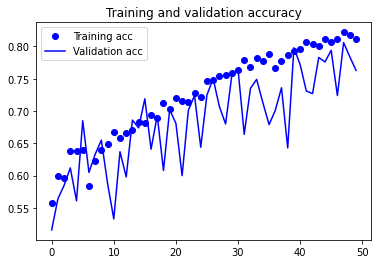
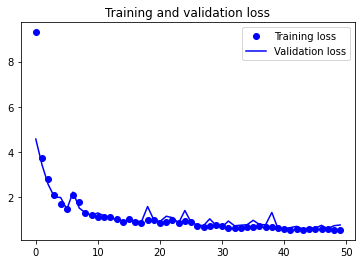

- train acc의 변동이 많이 줄었다!  

더 많은 실험을 진행하고 싶었지만, memory issue로 여기까지만 진행.

#### __결론__  
- VGG16 모델을 유지하면서는 성능 향상에 한계가 있어 레이어 수를 줄여 진행하였다.
- 레이어 수 감소와 메모리 문제로 인해 batch_size, IMG_HEIGHT, IMG_WIDTH를 줄여야 했다.
- BatchNormalization과 Dropout을 추가하였다.
- Dense layer에 L2 규제를 적용하여 과적합을 방지하고자 했다.
- (과적합 문제가 남아있지만) 최종적으로 val acc. 80% 가량을 달성했다.

# __프로젝트 2: Object Detection__  
- RCNN 계열의 모델들을 알아보고 object detection 모델의 코드를 살펴본 후, object detection task를 실제로 진행해 봅시다.

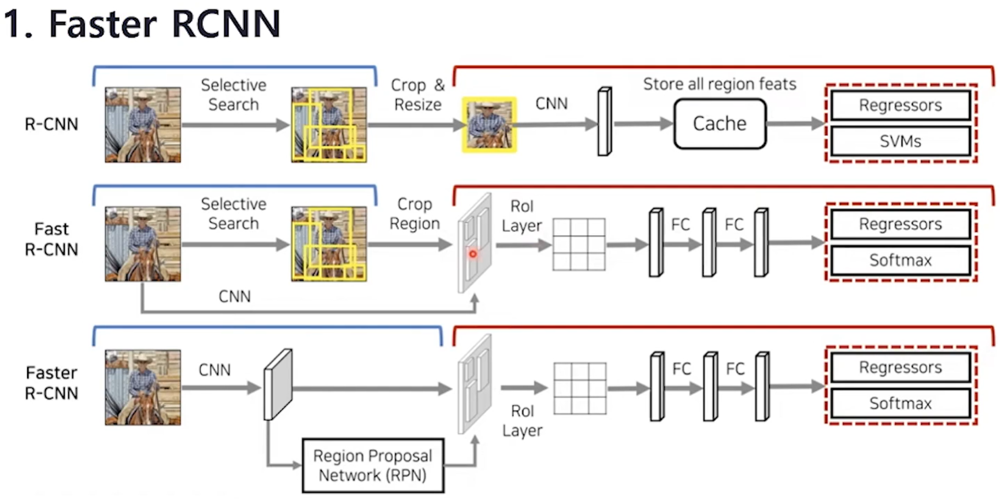  
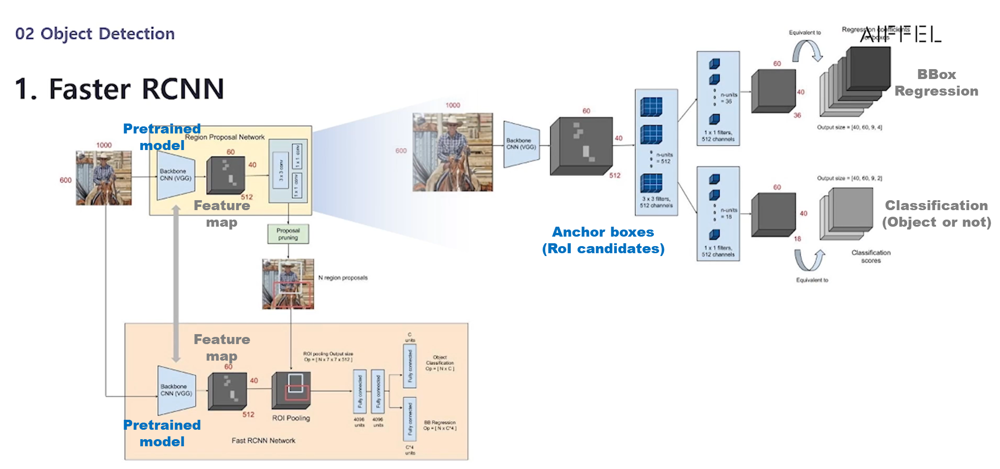

## __코드 살펴보기__
해당 코드는 [텐서플로우 공식 홈페이지의 튜토리얼](https://www.tensorflow.org/hub/tutorials/object_detection?hl=ko)에서 제시된 코드를 활용했습니다.

먼저 필요한 라이브러리를 불러옵니다.

In [1]:
# Tensorflow와 Tensoflow Hub에 있는 이미 학습된 모델을 활용하기 위한 모듈 
import tensorflow as tf
import tensorflow_hub as hub

# 이미지를 다운로드하는 데에 사용하는 모듈
import matplotlib.pyplot as plt
import tempfile 
from six.moves.urllib.request import urlopen
from six import BytesIO

# 이미지에 선과 폰트를 넣기 위한 모듈
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# Detection하는 데에 소요된 시간을 점검하기 위한 모듈
import time

이미지를 시각화하는 함수를 만들어 둡니다.

In [2]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)

원하는 이미지를 다운로드하고 정해진 가로, 세로 길이에 맞게 이미지를 resizing하는 함수를 만들어둡니다.

In [8]:
def download_and_resize_image(url, new_width=256, new_height=256, display=False): 
  
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)  # 이미지 읽기
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.Resampling.LANCZOS) # 이미지 조정
  pil_image_rgb = pil_image.convert("RGB") #RBG로 변환
  pil_image_rgb.save(filename, format="JPEG", quality=90) # 이미지 저장
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename

Bounding Box를 만드는 함수를 만듭니다.

In [9]:
def draw_bounding_box_on_image(image, 
                               ymin, xmin, ymax, xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)

# BBox 테두리 그리기
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin

이미지 위에 class 이름과 score를 나타내는 함수도 만듭니다.

In [10]:
# BBox 그리기
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1): 
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

# BBox 그리기 적용
  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])  # 박스 좌표값
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

이미지를 불러옵니다.

원하는 이미지를 불러오고, 가로와 세로를 변경해 보는 실험을 진행해 보세요.

In [ ]:
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

# 노트북 파일 사이즈를 줄이기 위해 원본 데이터를 불러오는 부분을 생략했습니다.

[tfhub](https://www.kaggle.com/models?tfhub-redirect=true)에서 사전 학습된(Pre-trained) [InceptionResnet](https://arxiv.org/pdf/1602.07261v2.pdf) 모델을 사용한 Faster RCNN 모델을 불러옵니다.

In [12]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"  

detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [13]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

Detector를 실행하는 함수를 만듭니다.

In [14]:
def run_detector(detector, path):
  img = load_img(path) 

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

# 소요시간 측정
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

# 이미지 추론 개수와 추론 시간 출력
  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

# 이미지 내 박스로 entity, scores를 추가하여 출력
  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

detector를 실행시켜 봅시다.






In [ ]:
run_detector(detector, downloaded_image_path)

```
Found 100 objects.  
Inference time:  65.05547380447388
```

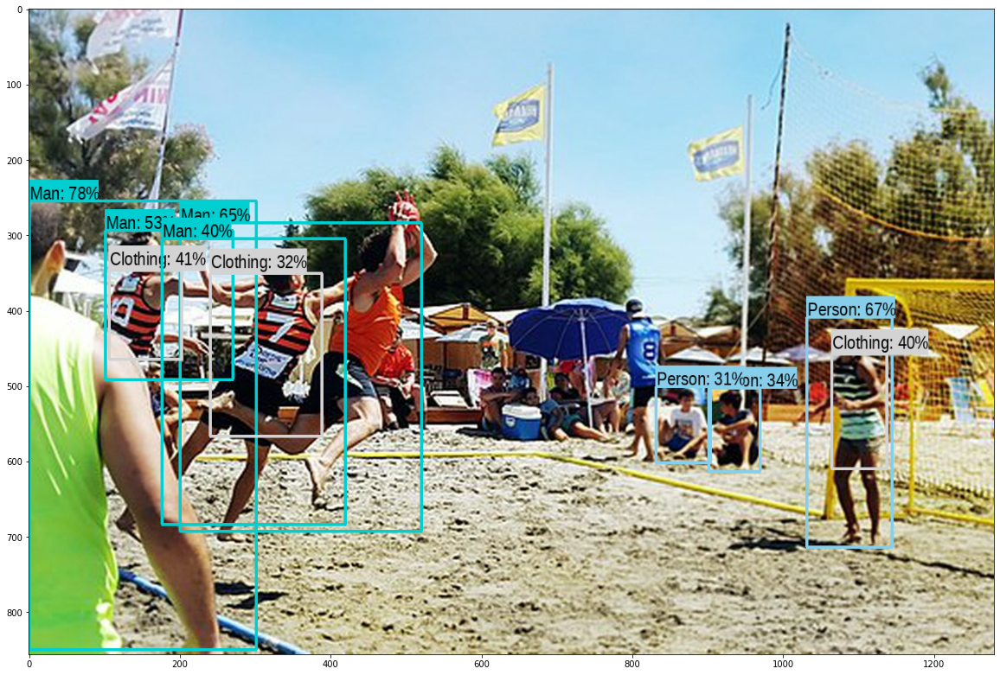

### __문제 2-1. 다른 이미지 테스트해보기__  
원하는 이미지를 불러와 결과를 확인해 봅시다.

In [ ]:
# 이미지 불러오기
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/b/b0/Brasil_vence_a_Fran%C3%A7a_no_v%C3%B4lei_masculino_1037987-15.08.2016_ffz-6369.jpg/2560px-Brasil_vence_a_Fran%C3%A7a_no_v%C3%B4lei_masculino_1037987-15.08.2016_ffz-6369.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1000, 800, True)  # new_width와 new_height를 변경해 보세요.

# 노트북 파일 사이즈를 줄이기 위해 원본 데이터를 불러오는 부분을 생략했습니다.

In [ ]:
# 테스트
run_detector(detector, downloaded_image_path)

```
Found 100 objects.
Inference time:  6.546969413757324
```

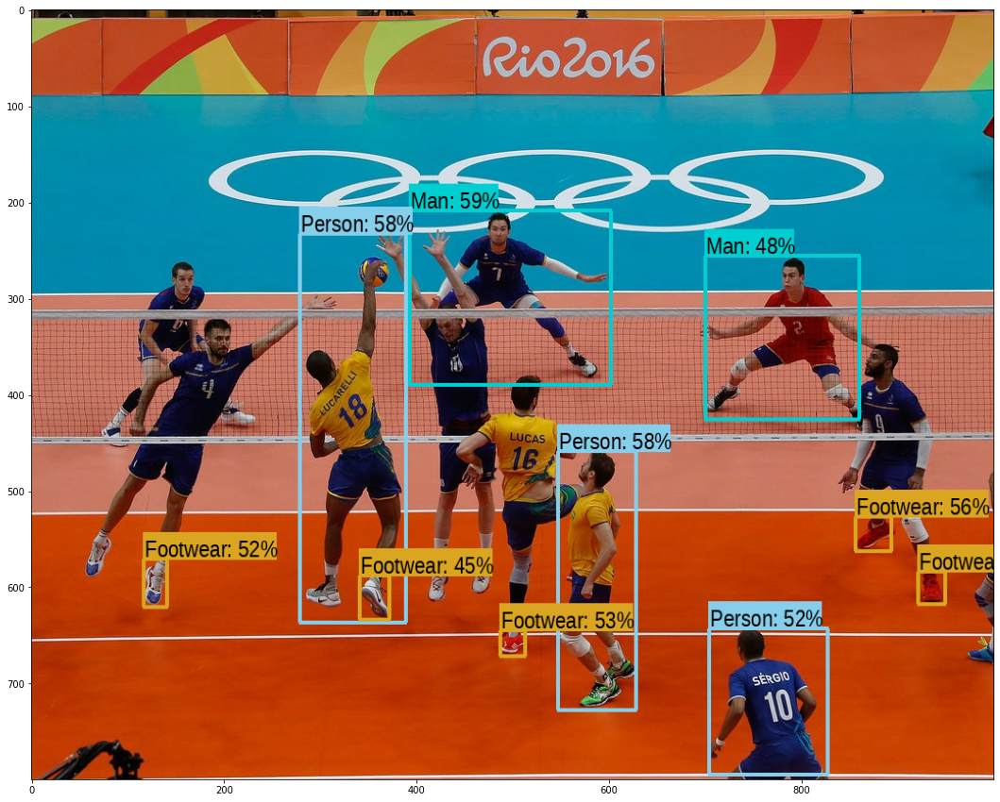

### __문제 2-2. 다양한 pre-trained model 테스트해보기__  
Faster RCNN 외에도 Object Detection을 할 수 있는 다양한 사전 학습 모델이 있습니다. tfhub을 탐색하여 사용할 수 있는 1개 이상의 모델을 불러와 결과를 테스트해보고, 그 결과를 비교해 보세요.

In [21]:
# 문제 2-2. 모델 불러오기
module_handle = "https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow1/variations/openimages-v4-ssd-mobilenet-v2/versions/1"  

detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [ ]:
# 문제 2-2. 테스트 
run_detector(detector, downloaded_image_path)

```
Found 100 objects.
Inference time:  63.57502245903015
```

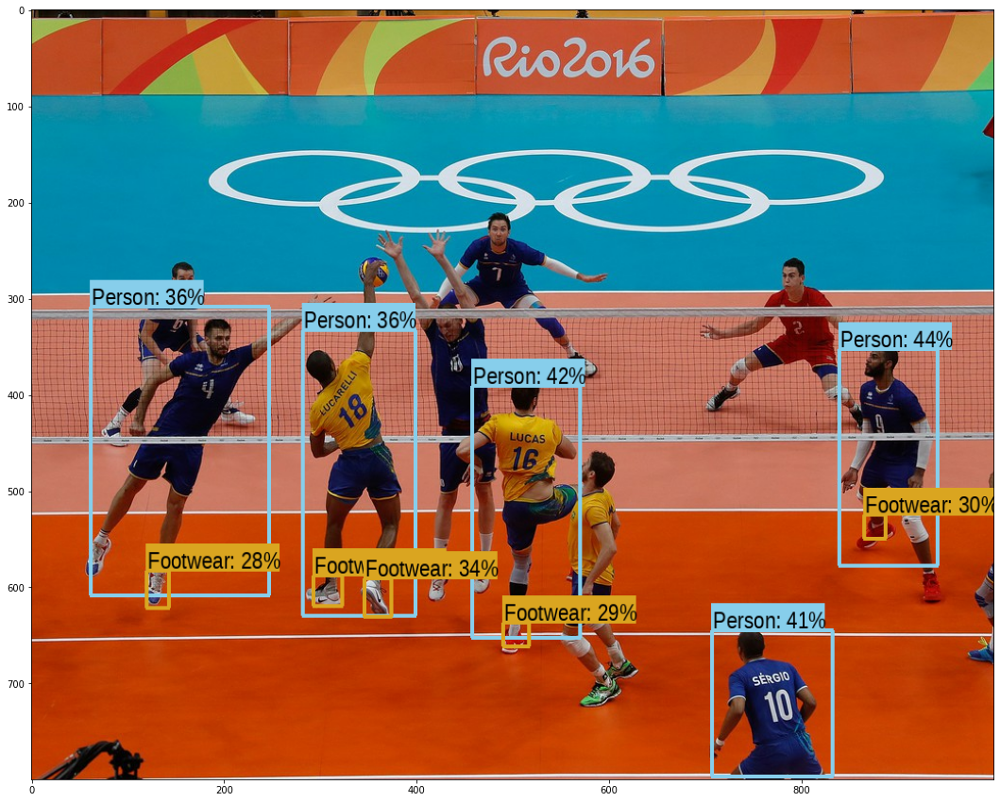

더 단순한 모델을 사용해서 그런지 인식률이 떨어졌다.
(이 아래부터는 결과만 첨부하겠습니다.)

1. InceptionResnet (Inference time:  40.47248387336731)  
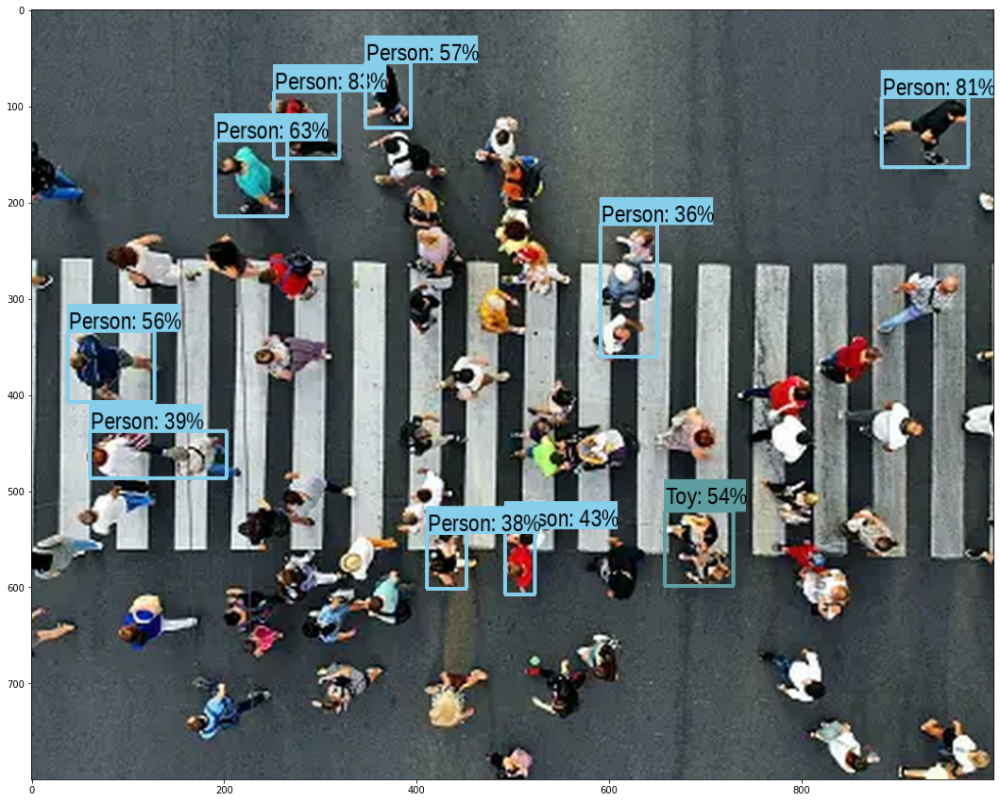

2. Mobilenet (Inference time:  8.254397869110107)  
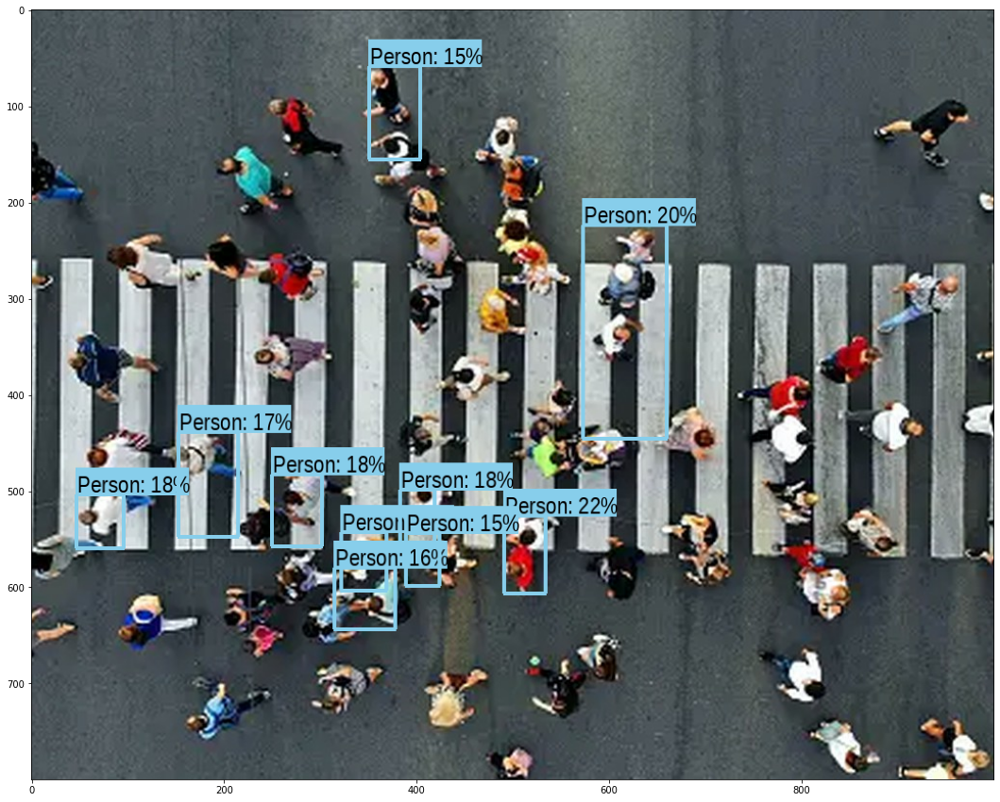

- 위에서 찍힌 모습인데도 사람을 인식하는 것이 신기.
- InceptionResNet의 경우 뜬금없이 사람을 Toy로 인식하는 경우가 있었다.
- Mobilenet이 더 많은 사람을 인식하기는 했지만, 인식률이 낮다.

1. InceptionResnet (Inference time:  41.097815990448)  
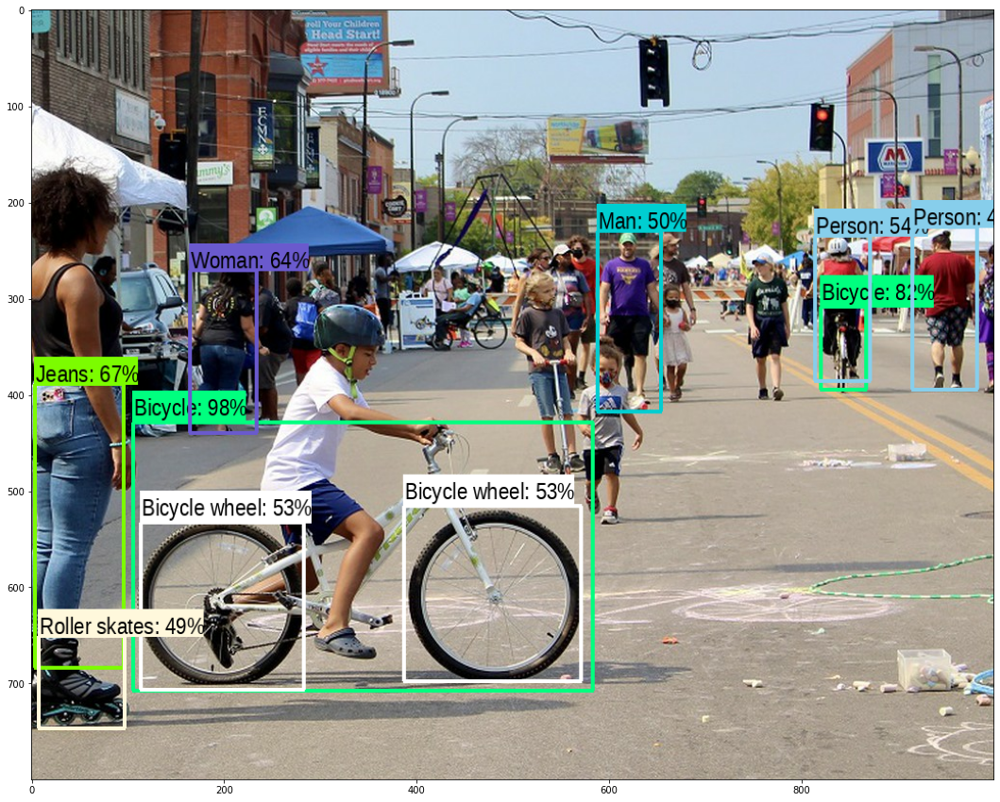

2. Mobilenet (Inference time:  9.277941703796387)  
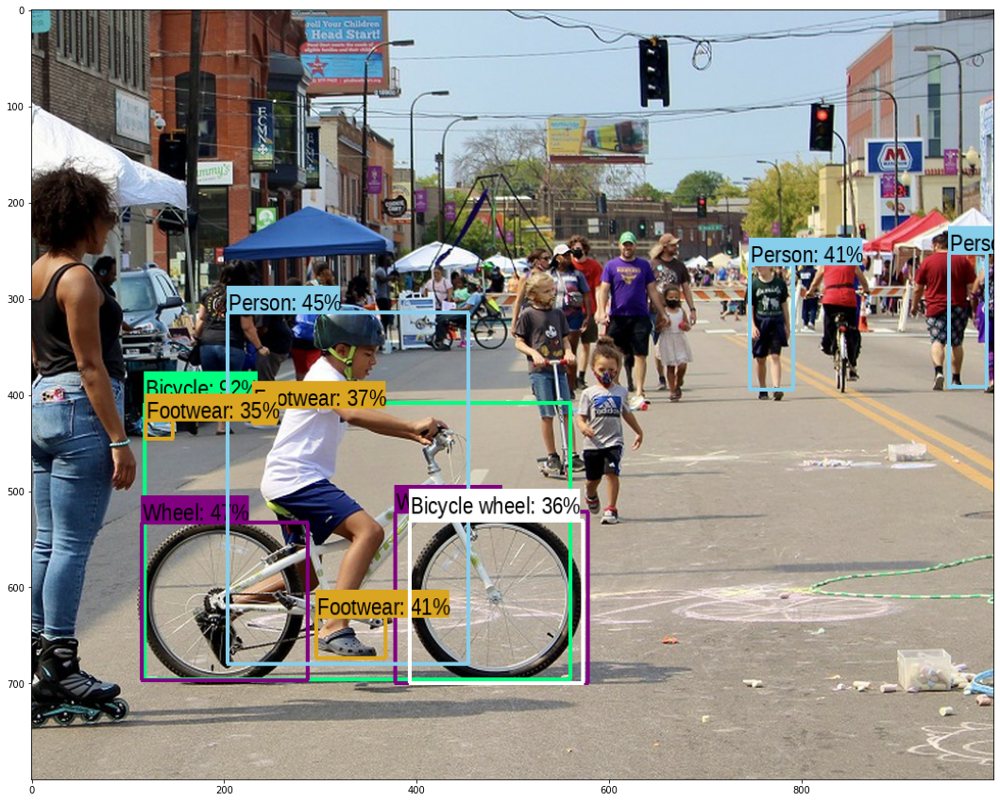

- InceptionResnet은 가장 앞에 있는 자전거를 타고 있는 사람을 인식하지는 못했지만 청바지, 롤러스케이트, 뒤에 있는 사람이 타고 있는 자전거 등을 인식했다.
- Mobilenet이 bounding box가 다소 부정확하게 그려지는 경향이 있다.

#### __[결론]__  
- Inception ResNet을 사용한 Faster RCNN은 조금 느리지만 높은 정확성을 보였다.
- MobileNet은 인식률은 다소 떨어지지만, 자전거를 타고 있는 사람을 정확히 인식하는 등 여러 요소를 포함하는 이미지에 대해 강세를 보였다.

# __회고__  
이것저것 시도해보는 게 진짜 실험하는 것 같은 기분이네요ㅋㅋ...  
아직 왜 그렇게 되는지까지는 완전히 이해할 수 없지만, VGG16을 유지하는 것보다 layer의 수를 줄였을 때 오히려 accuracy를 많이 높일 수 있었습니다. (데이터가 그리 많지 않아서 그런 것 같기도요...)  
object detection의 경우도 어떤 것에 대해 학습을 진행했는지에 따라 인식률이 달라지는 것이 재미있네요.  
그리고 많은 수의 pretrained model들을 보면서 일반화 모델을 만들기가 이렇게 어렵구나 싶은 생각도 들었습니다.  
딥러닝으로 넘어오니 확실히 GPU 없이는 작업이 힘들군요🤣 LMS 열심히 활용해야겠습니다.